# Hydrogen atom orbit

In [1]:
using LinearAlgebra
using PyPlot
using Formatting
PyPlot.using3D()
PyPlot.version

v"3.1.3"

## Associated Legendre polynomials
Associated Legendre polynomials($-l\le m\le l$)
$$P_l^{|m|}(\xi)=\frac{1}{2^{|m|}|m|!}(1-\xi^2)^{|m|/2}\frac{d^{|m|+l}}{d\xi^{|m|+l}}(\xi^2-1)^{l}$$
$$P_l^m(\xi)=\frac{2l-1}{l-m}\xi P_{l-1}^m(\xi)-\frac{l+m-1}{l-m}P_{l-2}^m(\xi)$$
$P_{m-1}^m(\xi)=0, P_m^m(\xi)=(2m-1)!!(1-\xi^2)^{\frac{|m|}{2}}, P_l^{-m}(\xi)=(-1)^m\frac{(l-m)!}{(l+m)!}P_l^m(\xi)$

In [2]:
# 二重階乗を行う関数
function doublefactorial(x)
    ans = x
    # 引数が0以下であれば機械的に１を返す。
    if ans <= 0
        return 1
    end
    # 二重階乗の計算 欠けた値が1か２になったら終了する。
    while !(x==1 || x==2)
        x -= 2
        ans *= x
    end
    return ans
end

# ラグランジュの陪多項式を求める。
function AssociatedLegendrePolynomial(l, m, xi)
    abs_m = abs(m)
    # mがlより大きいことはあり得ないので0を返す。
    if abs_m > l 
        return 0
    end
    # 2つ前の解を保存する先としてALP 1,ALP2を容易する。
    ALP1 = 0
    ALP2 = (1 - xi*xi)^(abs_m/2) * doublefactorial(2*abs_m-1)
    # mの絶対値とlの値が等しい時の処理。mの符号に気をつける。
    if abs_m == l
        if m >= 0
            return ALP2 
        else
            return (-1)^abs_m * ALP2 * factorial(l - abs_m)/factorial(l + abs_m)
        end
    end
    ALP3 = 0
    # 目的のlまで計算する。
    for i in abs_m+1:l
        ALP3 = ((2.0 * i - 1.0) * xi * ALP2 .- (i + abs_m - 1.0) * ALP1) / (i - abs_m)
        ALP1 = ALP2
        ALP2 = ALP3
    end
    # mが符号に気をつける。
    if m >= 0
        return ALP3
    else 
        return (-1)^abs_m * ALP3 * factorial(l - abs_m)/factorial(l + abs_m)
    end
end

AssociatedLegendrePolynomial (generic function with 1 method)

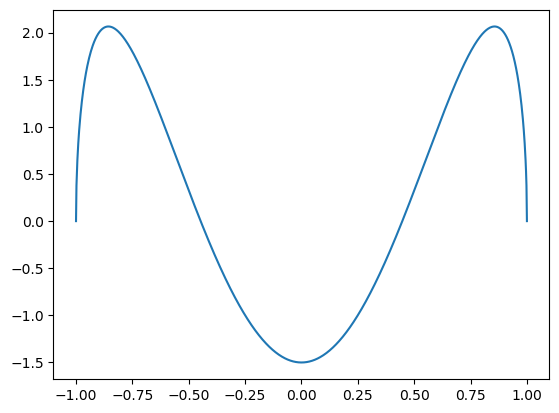

In [3]:
n = 1000
x = range(-1, 1, length=n)
# l=3, m = 1のときのラグランジュの陪多項式 横軸はcos(θ)でθは0~π
l = 3
m = 1
ALP = AssociatedLegendrePolynomial.(l, m, x)
plot(x, ALP);

## Spherical harmonic
$$Y_l^{m}(\theta,\phi)=(-1)^{m}\sqrt{\frac{2l+1}{4\pi}\frac{(l-m)!}{(l+m)!}}P_l^{m}(\cos{\theta})\mathrm{e}^{im\phi}$$

In [4]:
# 球面調和関数をラグランジュの陪多項式を利用して求める。
function SphericalHarmonic(l::Int, m::Int,  θ, φ)
    #　計算の煩雑化を防ぐため階乗の計算を先にする。
    calc_tmp = factorial(l-m)/factorial(l+m)
    SH = (-1)^m * sqrt((2l+1) * calc_tmp / 4pi) * AssociatedLegendrePolynomial(l, m, cos(θ)) * (cos(m*φ)+sin(m*φ)im)
    return SH
end

SphericalHarmonic (generic function with 1 method)

In [5]:
n = 1000
x = range(0, pi, length=n)
y = range(0, 2pi, length=n)
# l=3, m=1の場合の球面調和関数
l = 3
m = 1
using3D()
xgrid = repeat(x',n,1)
ygrid = repeat(y,1,n)
z = zeros(n, n)
for i in 1:n, j in 1:n
    z[i:i, j:j] .= abs(SphericalHarmonic(l, m, x[i], y[j]))
end

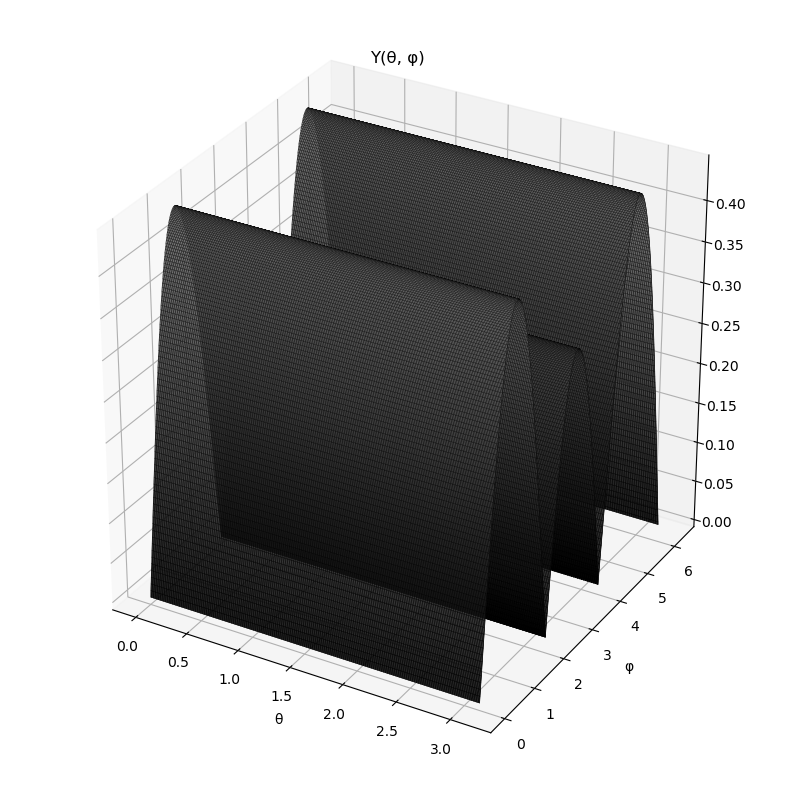

PyObject Text(0.5, 0.92, 'Y(θ, φ)')

In [6]:
fig = figure("pyplot_surfaceplot",figsize=(10,10))
ax = fig.add_subplot(1,1,1,projection="3d")
plot_surface(xgrid, ygrid, z, rstride=2,edgecolors="k", cstride=2, cmap=ColorMap("gray"), alpha=0.8, linewidth=0.25)
xlabel("θ")
ylabel("φ")
title("Y(θ, φ)")

# Associated Laguerre polynomials
$$R_n^l(r) = \sqrt{(\frac{2Z}{na_0})^3\frac{(n-l-1)!}{2n(n+l)!}}(\alpha r)^l\mathrm(e)^{-\alpha r/n}L_{n-l-1}^{2l+1}(\alpha r)\\
L_n^k(x) = \sum_{m=0}^n(-1)^m\frac{(n+k)!}{(n-m)!(k+m)!m!}x^m$$

In [7]:
# ラゲールの陪多項式
function AssociatedLaguerrePolynomials(n, l, r)
    Z = 1
    α = 1
    a_0 = 2*Z/n
    k = 2l+1
    nn = n-l-1
    L = 0
    for i in 0:nn
        L = L+(-1)^i*factorial(n+l)^2/(factorial(nn+2l-i)*factorial(k+i))*(α*r)^i
    end
    R = 2/n^2*sqrt((Z/a_0)^3*factorial(n-l-1)/factorial(n+l))^3 * (α*r)^l*exp(-α/n * r)*L
    return R
end

AssociatedLaguerrePolynomials (generic function with 1 method)

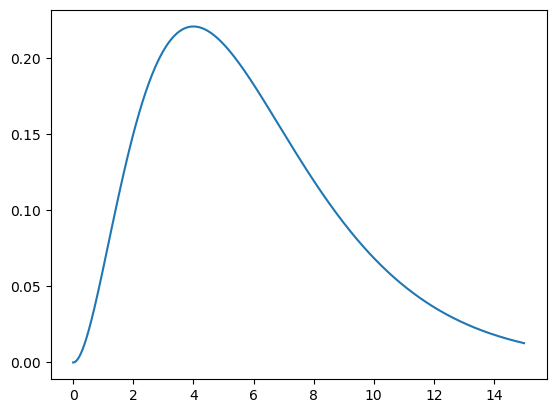

In [8]:
n = 1000
r = range(0, 15, length=n)
# n = 2, l=1のときのラゲールの陪多項式×r
ALP = AssociatedLaguerrePolynomials.(2, 1, r)
plot(r, r.*ALP);

# $$\psi_{nlm}(r,\theta,\phi)=R_n^l(r)Y_l^m(\theta, \phi)$$

In [9]:
# 波動関数を描画する関数。
function plotwave3D(fig, X, Y, Z, V, n)
    fig.clf()
    ax = fig.add_subplot(111, projection="3d")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    X1, X2, Y1, Y2, Z1, Z2 = [], [], [], [], [], []
    # ある位置の波動関数の値が正か負によって異なる配列に代入する。
    for i in 1:n
        if V[i] >= 0
            push!(X1, X[i])
            push!(Y1, Y[i])
            push!(Z1, Z[i])
        elseif V[i] < 0
            push!(X2, X[i])
            push!(Y2, Y[i])
            push!(Z2, Z[i])   
        end
    end
    ax.scatter3D(X1, Y1, Z1, s=0.5, c="red")
    ax.scatter3D(X2, Y2, Z2, s=0.5, c="blue")
end

plotwave3D (generic function with 1 method)

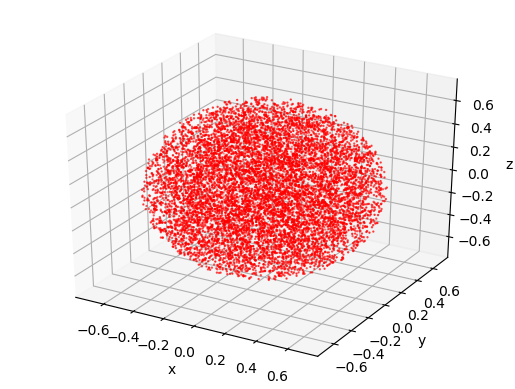

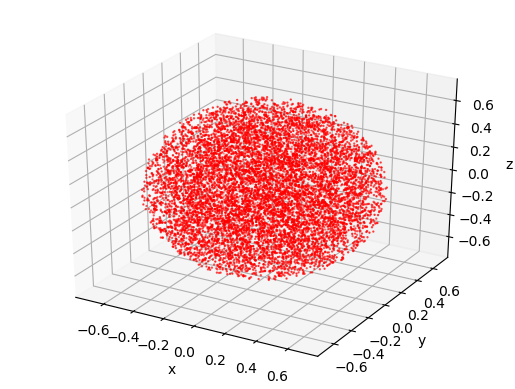

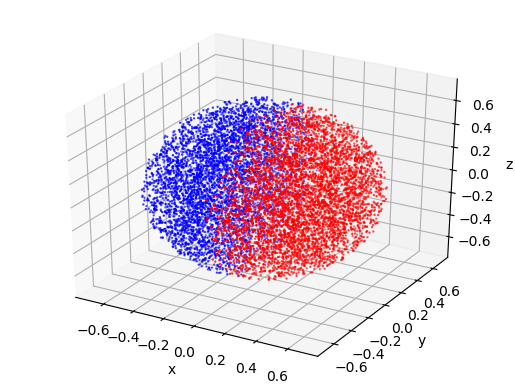

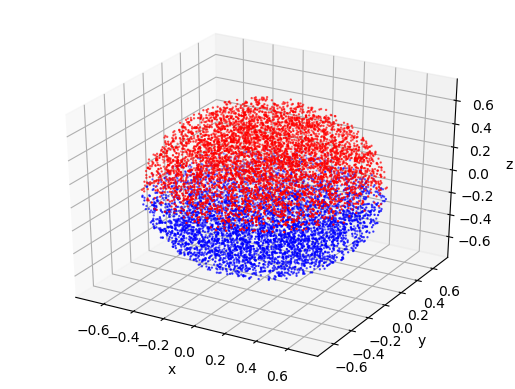

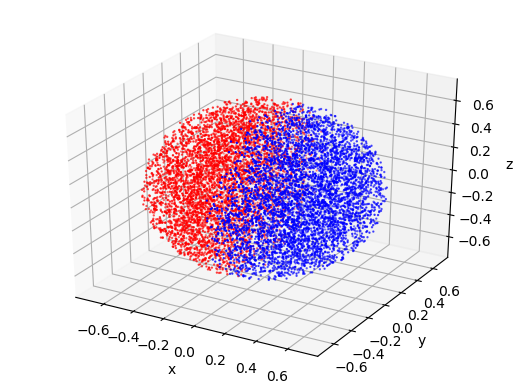

...

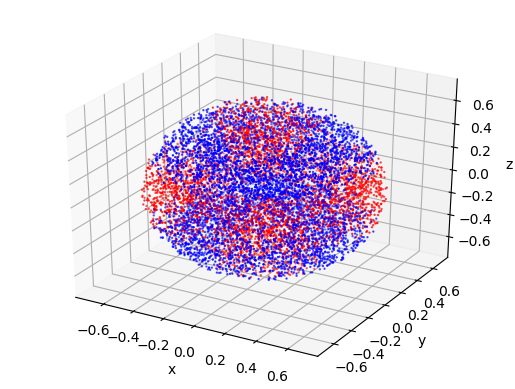

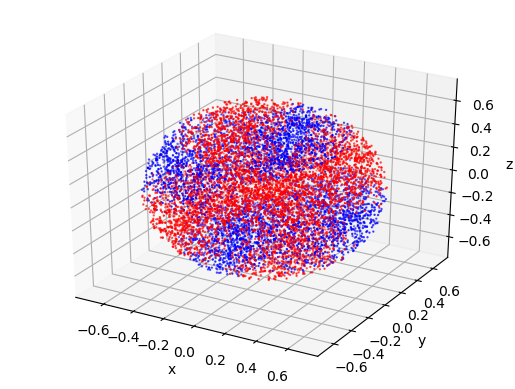

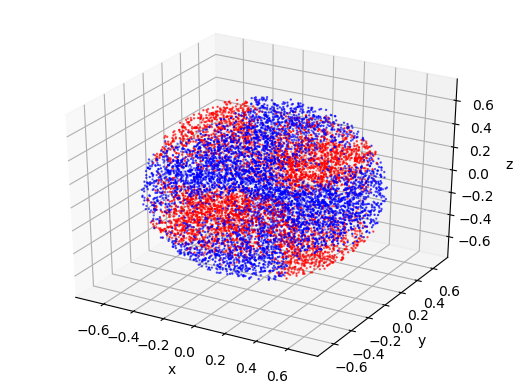

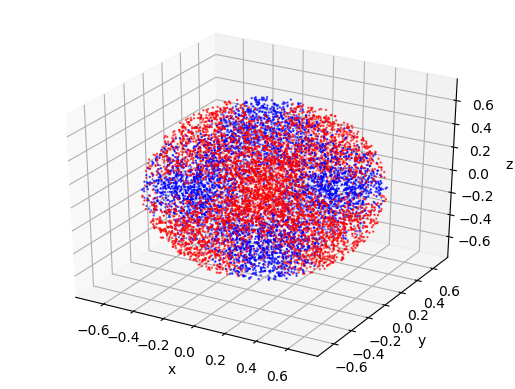

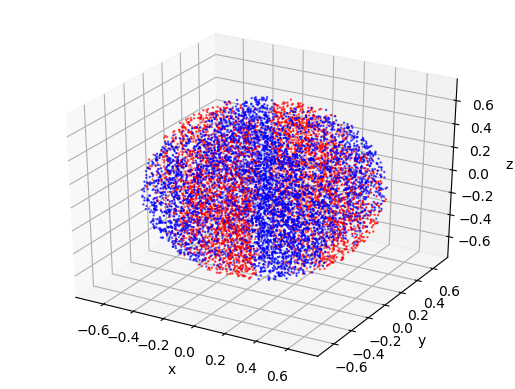

In [10]:
file_name = "./img/"
N = 10000
R = rand(N) ./ 3
Θ = 2 .* rand(N).-1
φ = 2pi .* rand(N)
r = cbrt.(R)
θ = acos.(Θ)
# 極座標から直交座標に直す。
X, Y, Z = [], [], []
for i in 1:N
    push!(X, r[i]*sin(θ[i])*cos(φ[i]))
    push!(Y, r[i]*sin(θ[i])*sin(φ[i]))
    push!(Z, r[i]*cos(θ[i]))
end
# 波動関数を求める関数(ラゲールの陪多項式と球面調和関数を掛け合わせただけ)
Wavefunction(n, l, m, r, θ, φ) = AssociatedLaguerrePolynomials(n, l, r)*SphericalHarmonic(l, m, θ, φ)
nn = 5
for n in 1:nn
    for l in 0: n-1
        for m in -l:l
            ValR =[]
            for i in 1:N
                push!(ValR, real(Wavefunction(n, l, m, r[i], θ[i], φ[i])))
            end
            fig = plt.figure()
            plotwave3D(fig, X, Y, Z, ValR, N)
            wavenum = format("n:{}_l:{}_m:{}.png", n, l, m)
            PyPlot.savefig(file_name * wavenum)
        end
    end
end